In [14]:
from IPython import display 
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import os
import sys
import glob
%matplotlib inline

In [86]:
exp_w = [
    [0.5, 1.0, 1.5, 3.0, 4.0],
    [1.0, 1.0, 1.0, 1.0, 1.0],
    [4.0, 3.0, 1.5, 1.0, 0.5],
    [8.0, 4.0, 2, 1.0, 0.5],  # for example_example it's [32.0, 16.0, 8.0, 2, 0.5]
    [1, 1, 0, 0, 0],
    [0, 0, 0, 0, 1]
]

def show_files(files):
    # w,h tuple in inches
    columns = 2 if len(files) > 1 else 1
    fig = plt.figure(figsize = (3.33 * scale, 2.5*(len(files)//columns)*scale)) 
    for i, file in enumerate(files):
        print(file)
        a = fig.add_subplot(len(files) / columns + 1, columns, i + 1)
        image = mpimg.imread(file)
        plt.imshow(image)
        
        
def show_foler(path, sort=True):

    files = glob.glob(path + '/*.jpg') + glob.glob(path + '/*.png')
    if sort:
        ids = [(int(file.split('/')[-1][:-4]), file) for file in files]  # outputs/279.png
        ids.sort(key=lambda t: t[0])
        files = [t[1] for t in ids]
    show_files(files)
        

scale = 4
def show_last(prefix):
    files = ['{}{}/299.png'.format(prefix,i) for i in range(10)]
    files = [file for file in files if os.path.exists(file)]
    show_files(files)

# Showing different pictures

content/gates.jpg
styles/mosaic.jpg
outputs_gates_mosaic_1/299.png
outputs_gates_mosaic_3/299.png
outputs_gates_mosaic_4/299.png
outputs_gates_mosaic_5/299.png


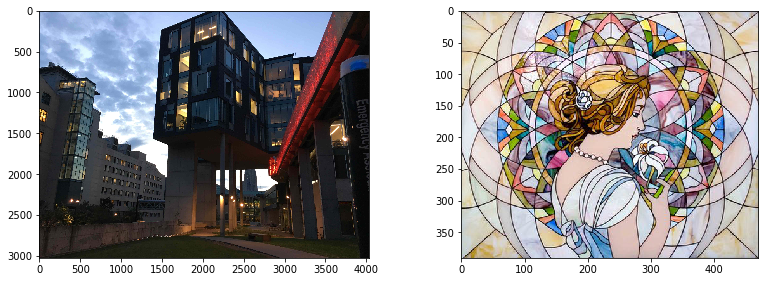

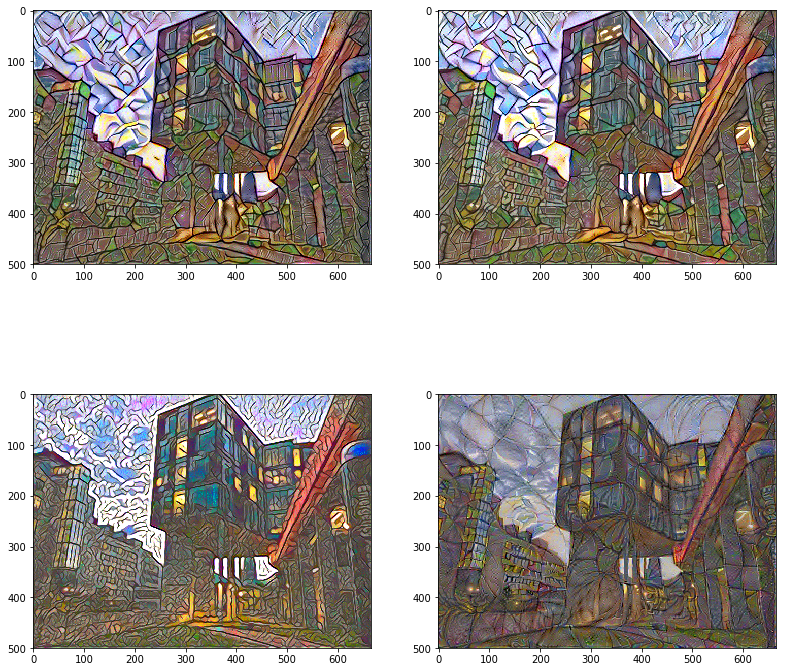

In [78]:
show_files(['content/gates.jpg', 'styles/mosaic.jpg'])
show_last('outputs_gates_mosaic_')

outputs_example_example_0/299.png
outputs_example_example_1/299.png
outputs_example_example_2/299.png
outputs_example_example_3/299.png


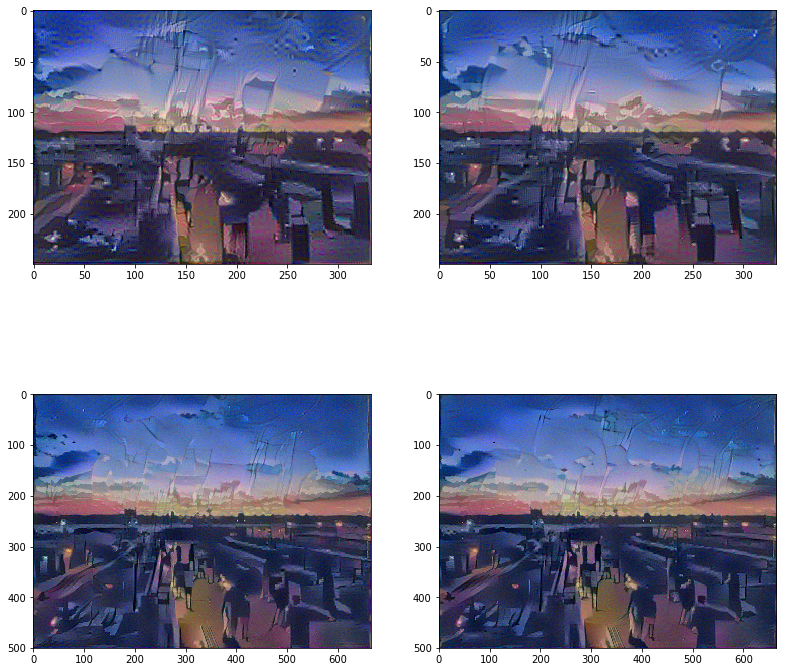

In [48]:
show_last('outputs_example_example_')

outputs_night_example_0/299.png
outputs_night_example_1/299.png
outputs_night_example_3/299.png


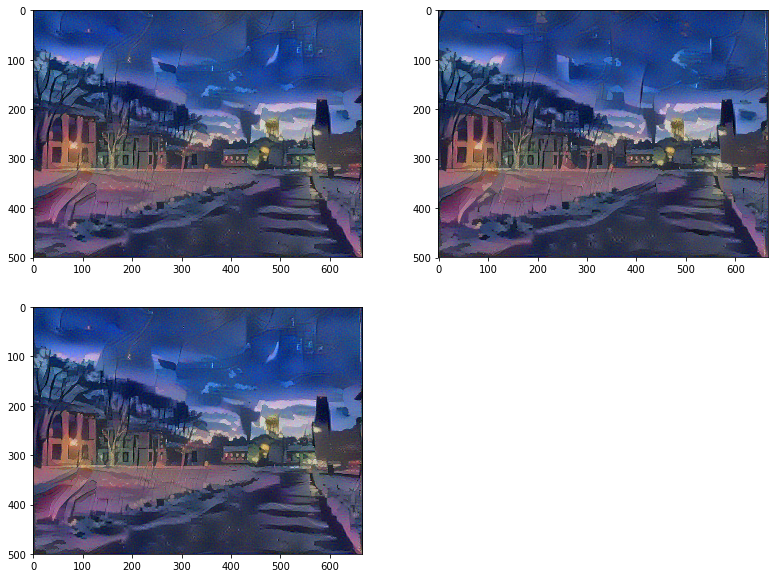

In [45]:
show_last('outputs_night_example_')

outputs_night_your-name_3/299.png


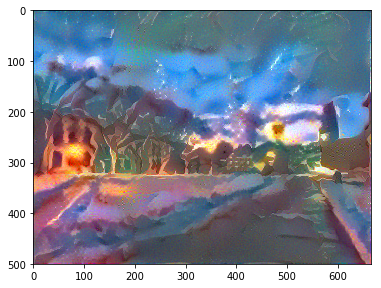

In [38]:
show_last('outputs_night_your-name_')

outputs_night_your-name-city_3/299.png


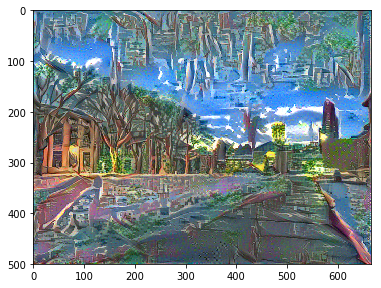

In [39]:
show_last('outputs_night_your-name-city_')

outputs_night_your-name-sky_1/299.png
outputs_night_your-name-sky_3/299.png


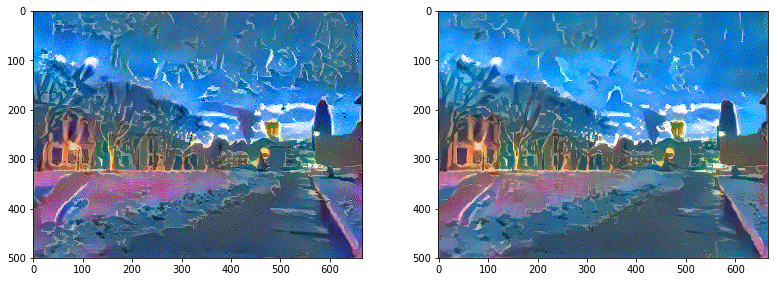

In [40]:
show_last('outputs_night_your-name-sky_')

outputs_rick-and-morty_your-name_3/299.png


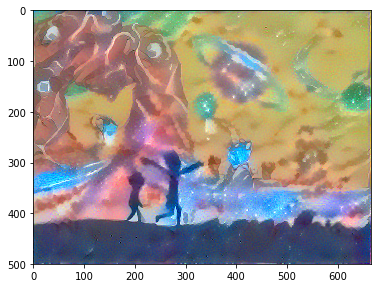

In [41]:
show_last('outputs_rick-and-morty_your-name_')

outputs_rick-and-morty_your-name-city_3/299.png


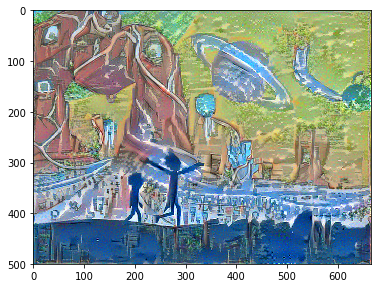

In [42]:
show_last('outputs_rick-and-morty_your-name-city_')

# Visualizing the picture generating process

[0, 1, 2, 3, 4, 9, 19, 49, 99, 149, 199, 249, 299]
outputs_gates_mosaic_3/0.png
outputs_gates_mosaic_3/49.png
outputs_gates_mosaic_3/99.png
outputs_gates_mosaic_3/199.png
outputs_gates_mosaic_3/299.png


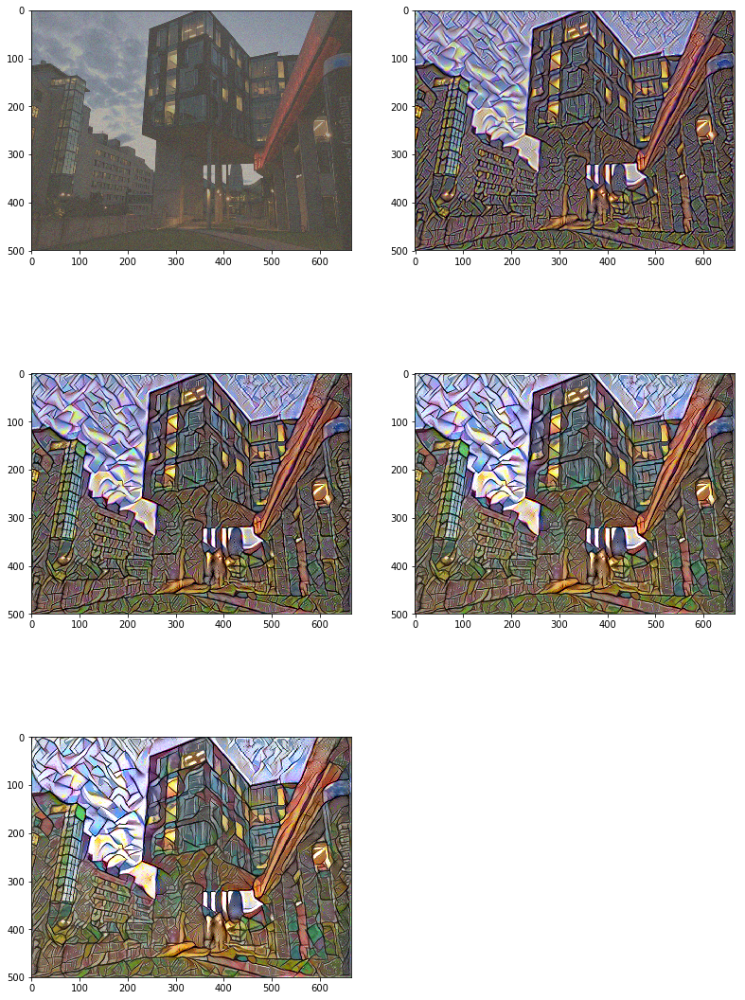

In [75]:
import pprint
def vis_process(path, num_steps=4, iters=None):
    files = glob.glob(path + '/*.jpg') + glob.glob(path + '/*.png')
    # list of tuple (279,outputs/279.png)
    ids = [(int(file.split('/')[-1][:-4]), file) for file in files]  
    ids.sort(key=lambda t: t[0])
    pprint.pprint([a[0] for a in ids])

    if iters:
        selected_files = [t[1] for t in ids if t[0] in iters]
    else:
        files = [t[1] for t in ids]
        idx = [len(files)//num_steps*i for i in range(0, num_steps - 1)]
        idx.append(-1)
        selected_files = [files[i] for i in idx]
    
    show_files(selected_files)
    
    
    
vis_process('outputs_gates_mosaic_3', iters=[0,49,99,199,299])

# Exploring styles: different style layer weight 
```
    exp_w = [
        [0.5, 1.0, 1.5, 3.0, 4.0],
        [1.0, 1.0, 1.0, 1.0, 1.0],
        [4.0, 3.0, 1.5, 1.0, 0.5],
        [8.0, 4.0, 2, 1.0, 0.5],
        [1, 1, 0, 0, 0],
        [0, 0, 0, 0, 1]
    ]
```

Below is a example of using different weight. 

Uhm actually it's not very different  = )

outputs_example_example_0/299.png
outputs_example_example_1/299.png
outputs_example_example_2/299.png
outputs_example_example_3/299.png


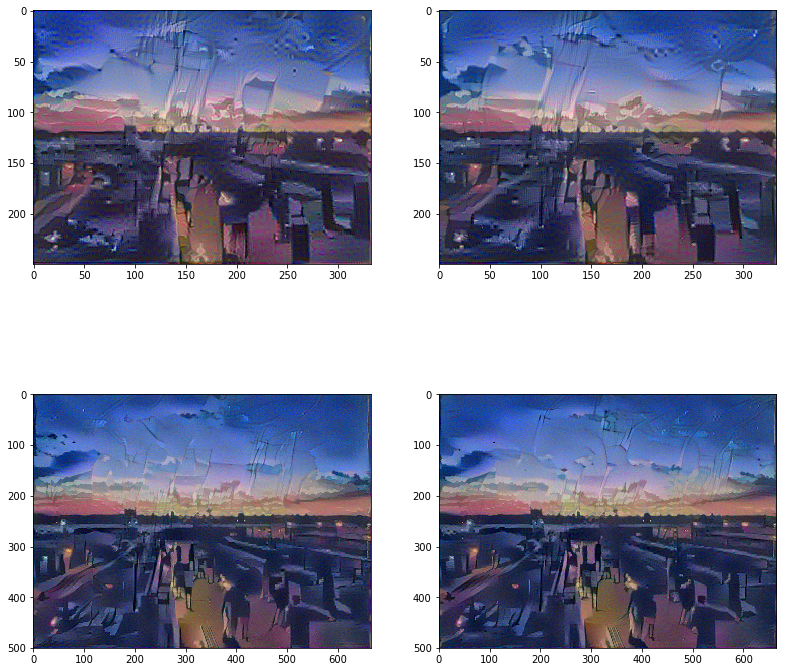

In [67]:
show_last('outputs_example_example_')

In [74]:
cs_pair = [
        [0.01, 1],
        [0.001, 1],
        [0.5,0.5],
        [1.0, 0.0]
]
for c, s in cs_pair:
    print(c,s)

0.01 1
0.001 1
0.5 0.5
1.0 0.0


content/example.jpg
styles/example.jpg
['outputs_example_example_0_1.0_0.0', 'outputs_example_example_0_0.001_1', 'outputs_example_example_0_0.5_0.5', 'outputs_example_example_0_0.1_1']
['outputs_example_example_0_1.0_0.0/299.png', 'outputs_example_example_0_0.001_1/299.png', 'outputs_example_example_0_0.5_0.5/299.png', 'outputs_example_example_0_0.1_1/299.png']
outputs_example_example_0_1.0_0.0/299.png
outputs_example_example_0_0.001_1/299.png
outputs_example_example_0_0.5_0.5/299.png
outputs_example_example_0_0.1_1/299.png


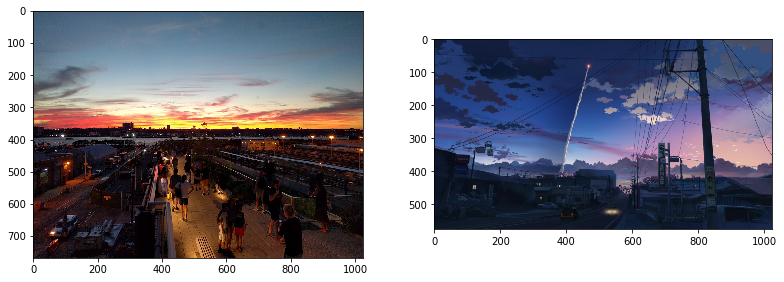

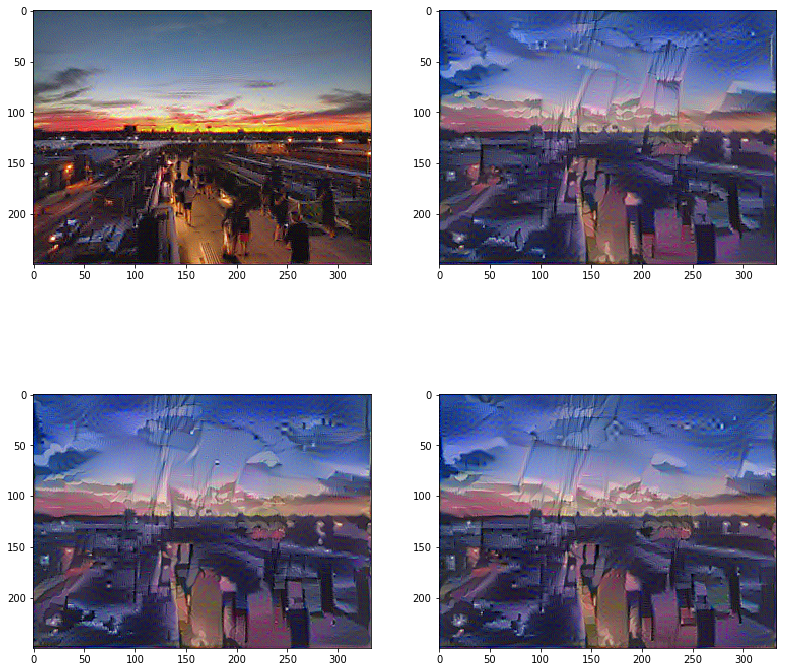

In [89]:
show_files(['content/example.jpg', 'styles/example.jpg'])


folders = glob.glob('outputs_example_example_0_*')
print(folders)
files = ['{}/299.png'.format(folder) for folder in folders]
print(files)
show_files(files)